In [15]:
from __future__ import print_function, division

import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler

import torchvision
import torchvision.transforms as transforms
from torchvision import datasets, models

#from imutils import paths
from pathlib import Path
import os, sys
import time
import copy

import pandas as pd
import matplotlib.pylab as plt
import numpy as np

from itertools import product
from PIL import Image

from lucent.optvis import render, param, transform, objectives
from lucent.modelzoo.util import get_model_layers
from lucent.misc.io import show
from lucent.misc.channel_reducer import ChannelReducer
from lucent.misc.io import show

# Local modules
from cub_tools.train import train_model
from cub_tools.visualize import imshow, visualize_model
from cub_tools.utils import unpickle, save_pickle
from cub_tools.transforms import makeAggresiveTransforms, makeDefaultTransforms, resizeCropTransforms

/anaconda/envs/py37_pytorch/lib/python3.7/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.decomposition.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.decomposition. Anything that cannot be imported from sklearn.decomposition is now part of the private API.
  warnings.warn(message, FutureWarning)


In [16]:
# Script runtime options
model = 'resnext101_32x8d'
root_dir = '..'
data_root_dir = os.path.join(root_dir, 'data')
model_root_dir = os.path.join(root_dir, 'models')
stages = ['test']


# Paths setup
data_dir = os.path.join(data_root_dir,'images')
output_dir = os.path.join(model_root_dir,'classification/{}'.format(model))
model_history = os.path.join(output_dir,'model_history.pkl')
model_file = os.path.join(output_dir, 'caltech_birds_{}_full.pth'.format(model))

In [17]:
# Get image transforms
# Get data transforms
data_transforms = resizeCropTransforms(img_crop_size=224, img_resize=256)

# Setup data loaders with augmentation transforms
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x), data_transforms[x])
                  for x in stages}
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=1,
                                             shuffle=True, num_workers=1)
              for x in stages}
dataset_sizes = {x: len(image_datasets[x]) for x in stages}
class_names = image_datasets[stages[0]].classes

In [4]:
# Setup the device to run the computations
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print('Device::', device)

Device:: cuda:0


In [5]:
# Load the best model from file
model_ = torch.load(model_file)
_ = model_.to(device).eval()

/anaconda/envs/py37_pytorch/lib/python3.7/site-packages/torch/serialization.py:657: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/anaconda/envs/py37_pytorch/lib/python3.7/site-packages/torch/serialization.py:657: SourceChangeWarning: source code of class 'torch.nn.modules.activation.ReLU' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/anaconda/envs/py37_pytorch/lib/python3.7/site-packages/torch/serialization.py:657: SourceChangeWarning: source code of class 'torch.nn.modules.linear.Linear' has changed. you can retrieve the original source code by acc

In [6]:
get_model_layers(model_)

['conv1',
 'bn1',
 'relu',
 'maxpool',
 'layer1',
 'layer1_0',
 'layer1_0_conv1',
 'layer1_0_bn1',
 'layer1_0_conv2',
 'layer1_0_bn2',
 'layer1_0_conv3',
 'layer1_0_bn3',
 'layer1_0_relu',
 'layer1_0_downsample',
 'layer1_0_downsample_0',
 'layer1_0_downsample_1',
 'layer1_1',
 'layer1_1_conv1',
 'layer1_1_bn1',
 'layer1_1_conv2',
 'layer1_1_bn2',
 'layer1_1_conv3',
 'layer1_1_bn3',
 'layer1_1_relu',
 'layer1_2',
 'layer1_2_conv1',
 'layer1_2_bn1',
 'layer1_2_conv2',
 'layer1_2_bn2',
 'layer1_2_conv3',
 'layer1_2_bn3',
 'layer1_2_relu',
 'layer2',
 'layer2_0',
 'layer2_0_conv1',
 'layer2_0_bn1',
 'layer2_0_conv2',
 'layer2_0_bn2',
 'layer2_0_conv3',
 'layer2_0_bn3',
 'layer2_0_relu',
 'layer2_0_downsample',
 'layer2_0_downsample_0',
 'layer2_0_downsample_1',
 'layer2_1',
 'layer2_1_conv1',
 'layer2_1_bn1',
 'layer2_1_conv2',
 'layer2_1_bn2',
 'layer2_1_conv3',
 'layer2_1_bn3',
 'layer2_1_relu',
 'layer2_2',
 'layer2_2_conv1',
 'layer2_2_bn1',
 'layer2_2_conv2',
 'layer2_2_bn2',
 'layer

## Diversity of neurons

In [7]:
def runDiversity(layerName, layerNeuron, imageSize=256, batch=4, weight=1e2):
    batch_param_f = lambda: param.image(imageSize, batch=batch)
    obj = objectives.channel(layerName, layerNeuron) - weight * objectives.diversity(layerName)
    _ = render.render_vis(model_, obj, batch_param_f, show_inline=True)

100%|██████████| 512/512 [00:57<00:00,  8.89it/s]



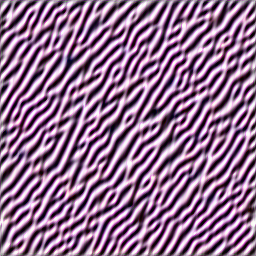
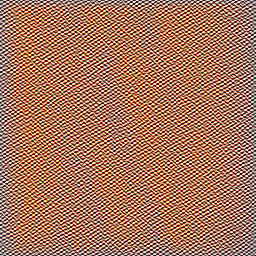
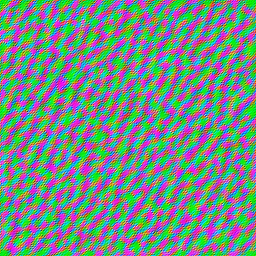
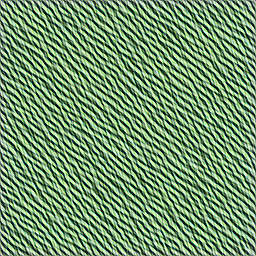

100%|██████████| 512/512 [00:52<00:00,  9.79it/s]



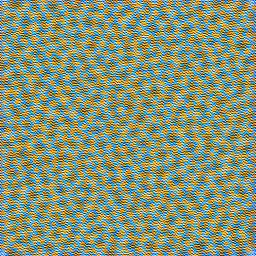
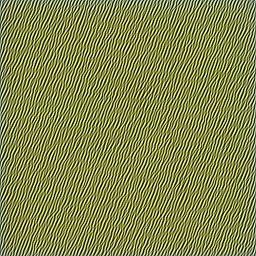
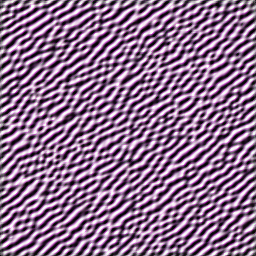
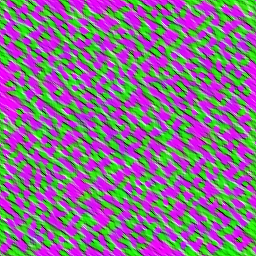

100%|██████████| 512/512 [00:57<00:00,  8.87it/s]



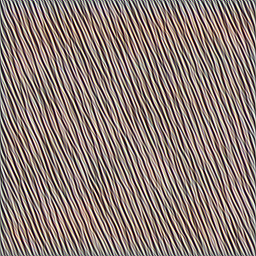
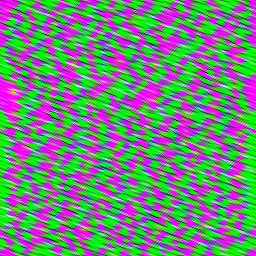
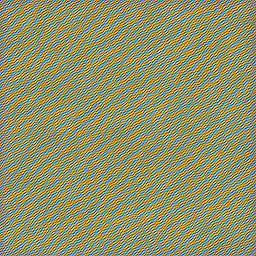
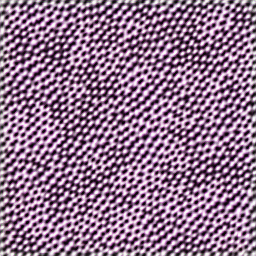

In [8]:
runDiversity('layer1', 24)

runDiversity('layer1_1', 24)

runDiversity('layer1_2', 24)

100%|██████████| 512/512 [01:02<00:00,  8.24it/s]



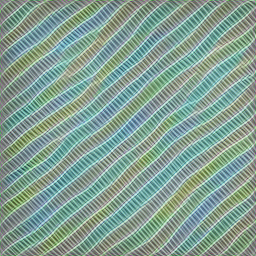
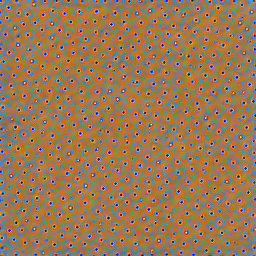
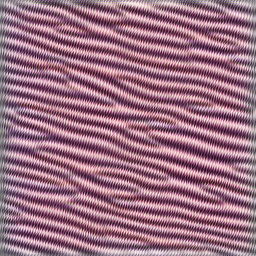
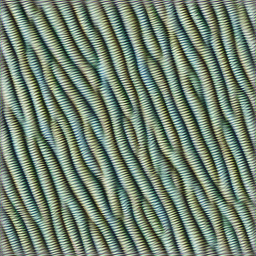

100%|██████████| 512/512 [01:05<00:00,  7.86it/s]



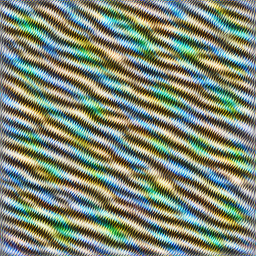
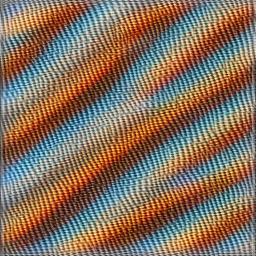
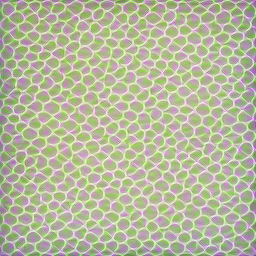
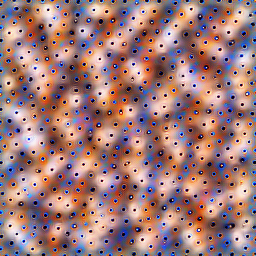

100%|██████████| 512/512 [01:08<00:00,  7.47it/s]



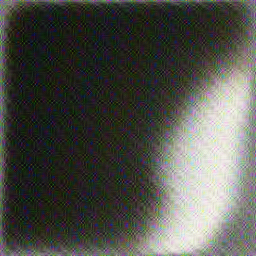
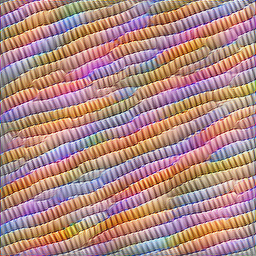
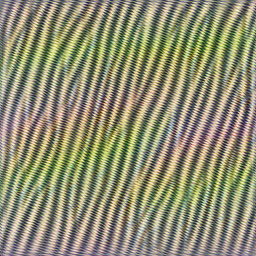
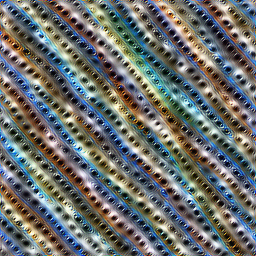

100%|██████████| 512/512 [01:11<00:00,  7.15it/s]



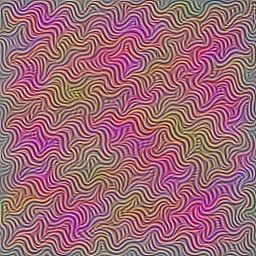
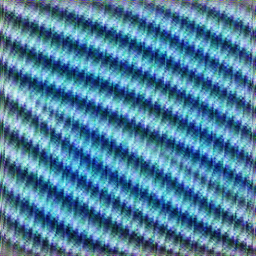
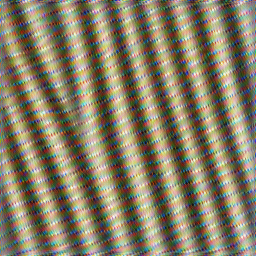
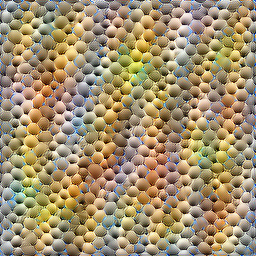

In [10]:
runDiversity('layer2_0', 214)

runDiversity('layer2_1', 234)

runDiversity('layer2_2', 363)

runDiversity('layer2_3', 163)

100%|██████████| 512/512 [01:19<00:00,  6.45it/s]



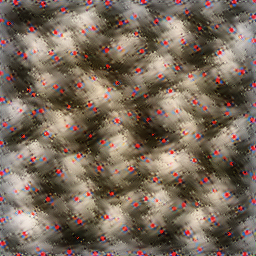
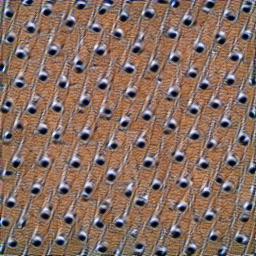
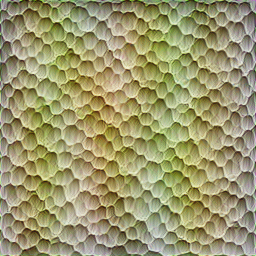
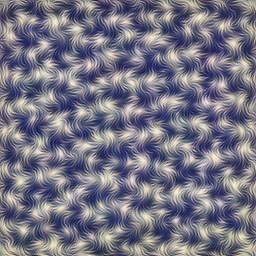

100%|██████████| 512/512 [01:30<00:00,  5.65it/s]



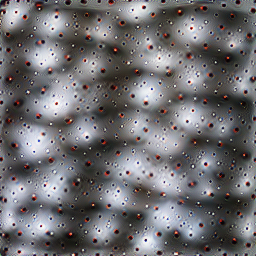
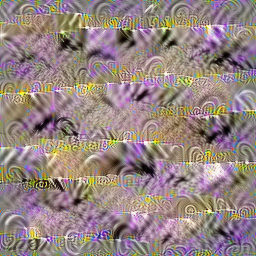
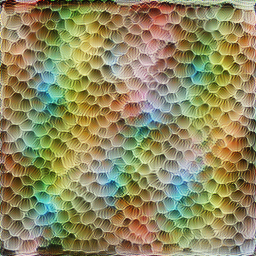
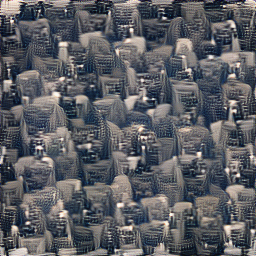

100%|██████████| 512/512 [01:41<00:00,  5.04it/s]



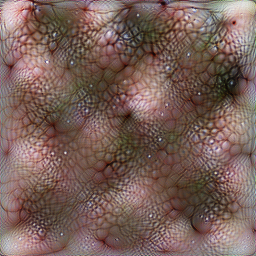
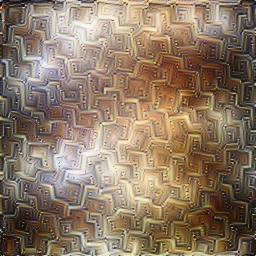
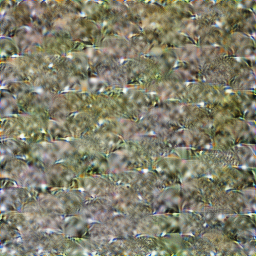
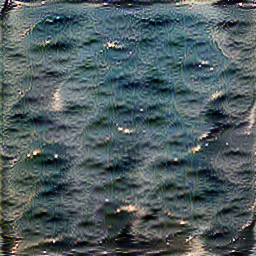

100%|██████████| 512/512 [01:51<00:00,  4.59it/s]



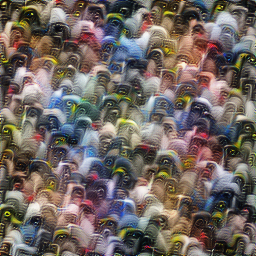
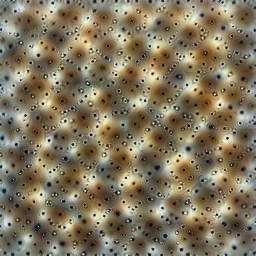
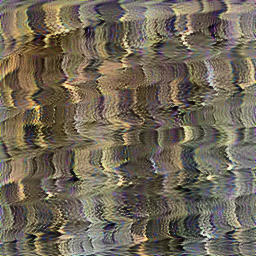
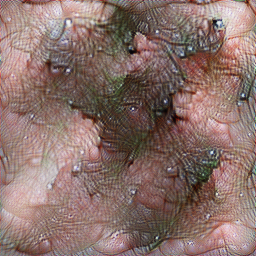

100%|██████████| 512/512 [01:58<00:00,  4.31it/s]



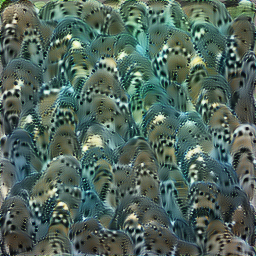
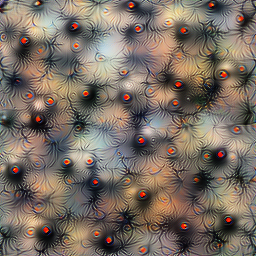
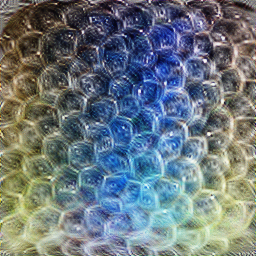
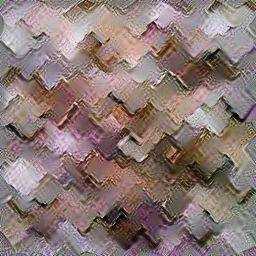

100%|██████████| 512/512 [02:08<00:00,  3.98it/s]



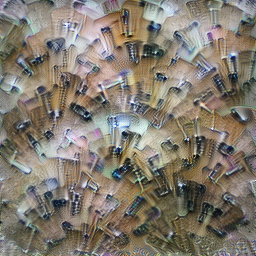
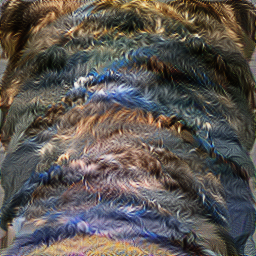
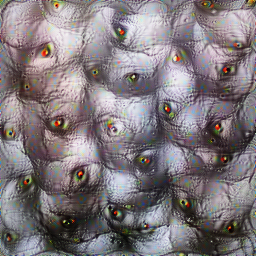
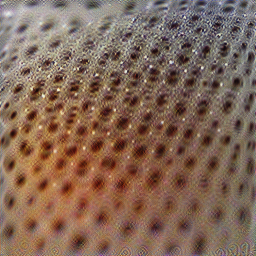

In [11]:
runDiversity('layer3_1', 255)

runDiversity('layer3_5', 123)

runDiversity('layer3_9', 224)

runDiversity('layer3_13', 255)

runDiversity('layer3_16', 123)

runDiversity('layer3_20', 224)

100%|██████████| 512/512 [02:26<00:00,  3.51it/s]



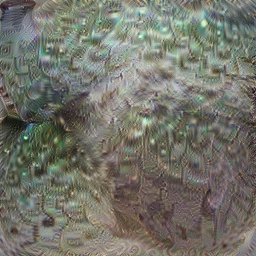
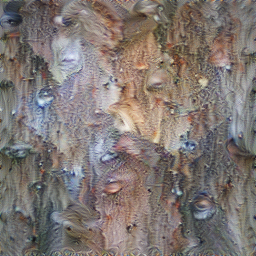
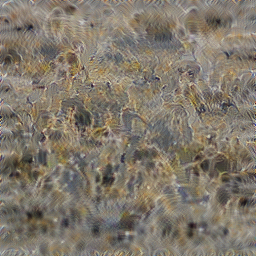
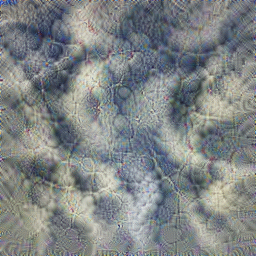

100%|██████████| 512/512 [02:29<00:00,  3.44it/s]



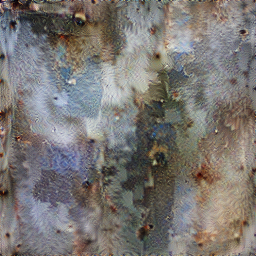
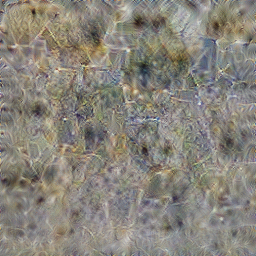
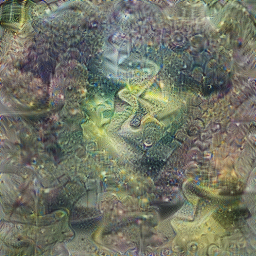
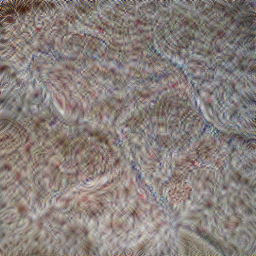

100%|██████████| 512/512 [02:32<00:00,  3.36it/s]



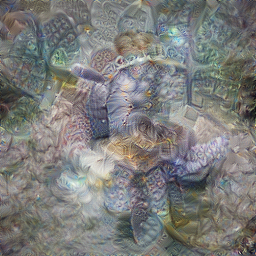
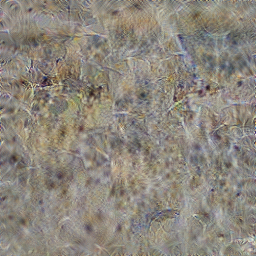
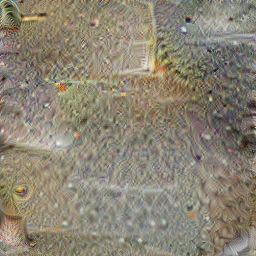
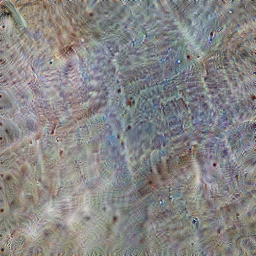

In [12]:
runDiversity('layer4_0', 214)

runDiversity('layer4_1', 435)

runDiversity('layer4_2', 363)

In [42]:
def runDiversitywithTransforms(layerName, layerNeuron, transforms=None, imageSize=256, batch=4, weight=1e2):
    if transforms == None:
        transforms = [
            transform.pad(16),
            transform.jitter(8),
            transform.random_scale([n/100. for n in range(80, 120)]),
            transform.random_rotate(list(range(-10,10)) + list(range(-5,5)) + 10*list(range(-2,2))),
            transform.jitter(2),
        ]
    batch_param_f = lambda: param.image(imageSize, batch=batch)
    obj = objectives.channel(layerName, layerNeuron) - weight * objectives.diversity(layerName)
    _ = render.render_vis(model_, obj, batch_param_f, transforms=transforms, show_inline=True)

100%|██████████| 512/512 [01:23<00:00,  6.10it/s]



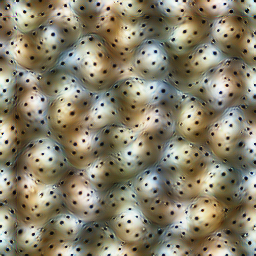
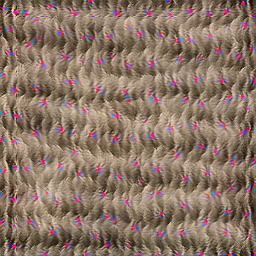
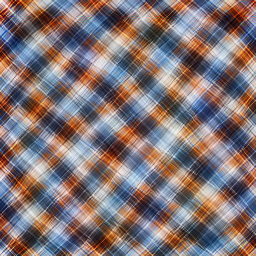
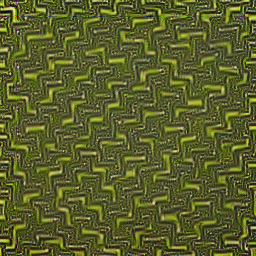

100%|██████████| 512/512 [01:35<00:00,  5.33it/s]



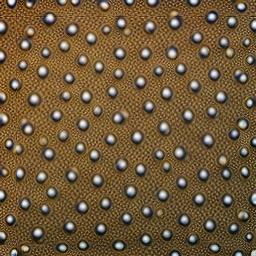
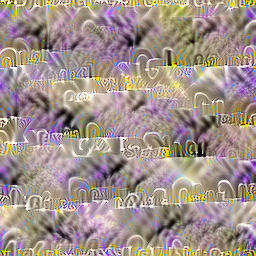
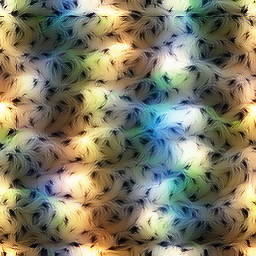
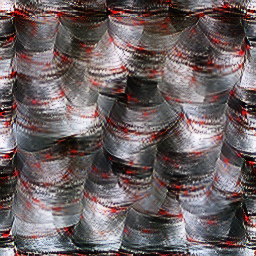

 75%|███████▍  | 382/512 [01:20<00:26,  4.86it/s]

Interrupted optimization at step 383.



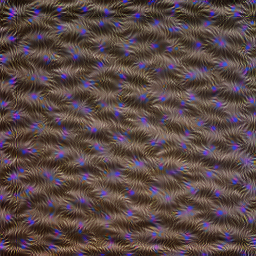
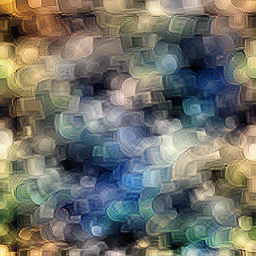
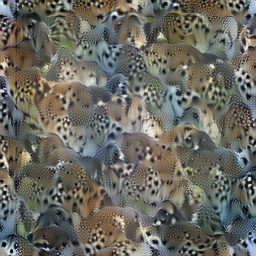
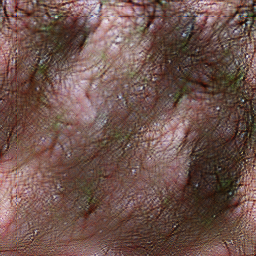


  0%|          | 0/512 [00:00<?, ?it/s]


Interrupted optimization at step 1.


KeyboardInterrupt: 

In [43]:
runDiversitywithTransforms('layer3_1', 255)

runDiversitywithTransforms('layer3_5', 123)

runDiversitywithTransforms('layer3_9', 224)

runDiversitywithTransforms('layer3_13', 255)

runDiversitywithTransforms('layer3_16', 123)

runDiversitywithTransforms('layer3_20', 224)

## Activation Atlas

In [36]:
@torch.no_grad()
def get_layer(model, layer, X):
    hook = render.ModuleHook(getattr(model, layer))
    model(X)
    hook.close()
    return hook.features


@objectives.wrap_objective()
def dot_compare(layer, acts, batch=1):
    def inner(T):
        pred = T(layer)[batch]
        return -(pred * acts).sum(dim=0, keepdims=True).mean()

    return inner

In [37]:
def render_activation_grid(
    img,
    model,
    layer="mixed4d",
    cell_image_size=60,
    n_groups=6,
    n_steps=1024,
    batch_size=64,
):
    # First wee need, to normalize and resize the image
    img = torch.tensor(np.transpose(img, [2, 0, 1])).to(device)
    normalize = (
        transform.preprocess_inceptionv1()
        if model._get_name() == "InceptionV1"
        else transform.normalize()
    )
    transforms = transform.standard_transforms.copy() + [
        normalize,
        torch.nn.Upsample(size=224, mode="bilinear", align_corners=True),
    ]
    transforms_f = transform.compose(transforms)
    # shape: (1, 3, original height of img, original width of img)
    img = img.unsqueeze(0)
    # shape: (1, 3, 224, 224)
    img = transforms_f(img)

    # Here we compute the activations of the layer `layer` using `img` as input
    # shape: (layer_channels, layer_height, layer_width), the shape depends on the layer
    acts = get_layer(model, layer, img)[0]
    # shape: (layer_height, layer_width, layer_channels)
    acts = acts.permute(1, 2, 0)
    # shape: (layer_height*layer_width, layer_channels)
    acts = acts.view(-1, acts.shape[-1])
    acts_np = acts.cpu().numpy()
    nb_cells = acts.shape[0]

    # negative matrix factorization `NMF` is used to reduce the number
    # of channels to n_groups. This will be used as the following.
    # Each cell image in the grid is decomposed into a sum of
    # (n_groups+1) images. First, each cell has its own set of parameters
    #  this is what is called `cells_params` (see below). At the same time, we have
    # a of group of images of size 'n_groups', which also have their own image parametrized
    # by `groups_params`. The resulting image for a given cell in the grid
    # is the sum of its own image (parametrized by `cells_params`)
    # plus a weighted sum of the images of the group. Each each image from the group
    # is weighted by `groups[cell_index, group_idx]`. Basically, this is a way of having
    # the possibility to make cells with similar activations have a similar image, because
    # cells with similar activations will have a similar weighting for the elements
    # of the group.
    if n_groups > 0:
        reducer = ChannelReducer(n_groups, "NMF")
        groups = reducer.fit_transform(acts_np)
        groups /= groups.max(0)
    else:
        groups = np.zeros([])
    # shape: (layer_height*layer_width, n_groups)
    groups = torch.from_numpy(groups)

    # Parametrization of the images of the groups (we have 'n_groups' groups)
    groups_params, groups_image_f = param.fft_image(
        [n_groups, 3, cell_image_size, cell_image_size]
    )
    # Parametrization of the images of each cell in the grid (we have 'layer_height*layer_width' cells)
    cells_params, cells_image_f = param.fft_image(
        [nb_cells, 3, cell_image_size, cell_image_size]
    )

    # First, we need to construct the images of the grid
    # from the parameterizations

    def image_f():
        groups_images = groups_image_f()
        cells_images = cells_image_f()
        X = []
        for i in range(nb_cells):
            x = 0.7 * cells_images[i] + 0.5 * sum(
                groups[i, j] * groups_images[j] for j in range(n_groups)
            )
            X.append(x)
        X = torch.stack(X)
        return X

    # make sure the images are between 0 and 1
    image_f = param.to_valid_rgb(image_f, decorrelate=True)

    # After constructing the cells images, we sample randomly a mini-batch of cells
    # from the grid. This is to prevent memory overflow, especially if the grid
    # is large.
    def sample(image_f, batch_size):
        def f():
            X = image_f()
            inds = torch.randint(0, len(X), size=(batch_size,))
            inputs = X[inds]
            # HACK to store indices of the mini-batch, because we need them
            # in objective func. Might be better ways to do that
            sample.inds = inds
            return inputs

        return f

    image_f_sampled = sample(image_f, batch_size=batch_size)

    # Now, we define the objective function

    def objective_func(model):
        # shape: (batch_size, layer_channels, cell_layer_height, cell_layer_width)
        pred = model(layer)
        # use the sampled indices from `sample` to get the corresponding targets
        target = acts[sample.inds].to(pred.device)
        # shape: (batch_size, layer_channels, 1, 1)
        target = target.view(target.shape[0], target.shape[1], 1, 1)
        dot = (pred * target).sum(dim=1).mean()
        return -dot

    obj = objectives.Objective(objective_func)

    def param_f():
        # We optimize the parametrizations of both the groups and the cells
        params = list(groups_params) + list(cells_params)
        return params, image_f_sampled

    results = render.render_vis(
        model,
        obj,
        param_f,
        thresholds=(n_steps,),
        show_image=False,
        progress=True,
        fixed_image_size=cell_image_size,
    )
    # shape: (layer_height*layer_width, 3, grid_image_size, grid_image_size)
    imgs = image_f()
    imgs = imgs.cpu().data
    imgs = imgs[:, :, 2:-2, 2:-2]
    # turn imgs into a a grid
    grid = torchvision.utils.make_grid(imgs, nrow=int(np.sqrt(nb_cells)), padding=0)
    grid = grid.permute(1, 2, 0)
    grid = grid.numpy()
    render.show(grid)
    return imgs

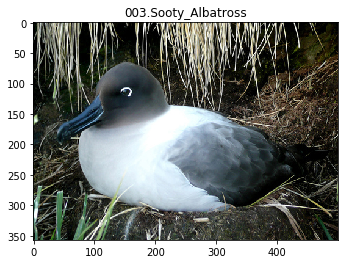

In [35]:
img_id = 61

img = np.array(Image.open(image_datasets['test'].imgs[img_id][0]), np.float32)
plt.figure()
plt.imshow(img/255.0)
plt.title(class_names[image_datasets['test'].imgs[img_id][1]])
plt.show()

In [41]:
_ = render_activation_grid(img, model_, cell_image_size=60, n_steps=1024, batch_size=64, layer='layer3_13')

AttributeError: 'ResNet' object has no attribute 'layer3_13'